In [3]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import os
import gc

train_csv_path = '/kaggle/input/amex-default-prediction/train_data.csv'
test_csv_path = '/kaggle/input/amex-default-prediction/test_data.csv'
labels_csv_path = '/kaggle/input/amex-default-prediction/train_labels.csv'
train_feather_path = '/kaggle/working/train_with_labels.feather'
test_feather_path = '/kaggle/working/test.feather'

def reduce_precision(df):
    for col in df.select_dtypes(include=['float64']).columns:
        df[col] = df[col].astype('float32')
    for col in df.select_dtypes(include=['int64']).columns:
        df[col] = df[col].astype('int32')
    return df

if not os.path.exists(train_feather_path):
    labels = pd.read_csv(labels_csv_path)
    train = dd.read_csv(train_csv_path)
    train = train.merge(labels, on='customer_ID', how='left')
    train = train.map_partitions(reduce_precision)
    train.compute().to_feather(train_feather_path)
    del train, labels
    gc.collect()
else:
    train = pd.read_feather(train_feather_path)

if not os.path.exists(test_feather_path):
    gc.collect()
    test = dd.read_csv(test_csv_path)
    test = test.map_partitions(reduce_precision)
    test.compute().to_feather(test_feather_path)
    del test
    gc.collect()
else:
    test = pd.read_feather(test_feather_path)

if 'train' in locals():
    print(f"Train data shape: {train.shape}")
if 'test' in locals():
    print(f"Test data shape: {test.shape}")


Train data shape: (5531451, 191)
Test data shape: (11363762, 190)


In [3]:
train.describe()

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
count,5.485466e+06,5.531451e+06,5.531451e+06,5.529435e+06,5.531451e+06,4.510907e+06,5.529435e+06,5.529435e+06,791314.000000,3.873055e+06,...,1.946990e+05,1.946990e+05,5.429903e+06,5.490819e+06,5.429903e+06,944408.000000,5.429903e+06,5.490724e+06,5.429903e+06,5.531451e+06
mean,6.563343e-01,1.531172e-01,1.240101e-01,6.214890e-01,7.880273e-02,2.258454e-01,5.978473e-02,1.325390e-01,0.184974,1.546841e-01,...,1.424409e-02,1.646184e-01,1.789304e-01,2.664348e-02,1.645212e-01,0.390799,1.788023e-01,5.238953e-02,6.233494e-02,2.490972e-01
std,2.446494e-01,2.700709e-01,2.119869e-01,4.014876e-01,2.263971e-01,1.933475e-01,2.025443e-01,2.349929e-01,0.228185,2.133977e-01,...,9.571116e-02,2.670208e-01,3.790614e-01,1.455480e-01,3.482771e-01,0.236182,3.789498e-01,1.825135e-01,1.934937e-01,4.324903e-01
min,-4.589548e-01,5.026190e-09,-7.588799e+00,9.192280e-09,1.534223e-09,-6.271321e-01,5.566545e-10,6.285293e-09,-0.000454,1.154550e-07,...,1.078787e-08,3.307923e-08,3.767347e-10,3.725073e-09,1.650100e-10,-0.014539,5.549692e-09,2.500991e-09,1.226024e-09,0.000000e+00
25%,4.803307e-01,4.528464e-03,8.863645e-03,1.053313e-01,2.895934e-03,1.272588e-01,2.873244e-03,5.227570e-03,0.037516,4.227546e-02,...,2.532470e-03,3.517452e-03,3.027212e-03,2.555848e-03,3.026087e-03,0.199399,3.028116e-03,2.752895e-03,3.028347e-03,0.000000e+00
50%,6.942950e-01,9.056902e-03,3.132968e-02,8.143328e-01,5.782230e-03,1.639082e-01,5.746725e-03,9.777229e-03,0.120519,8.851244e-02,...,5.069830e-03,7.037814e-03,6.053010e-03,5.110523e-03,6.051590e-03,0.382136,6.053151e-03,5.508129e-03,6.053247e-03,0.000000e+00
75%,8.648159e-01,2.366407e-01,1.259019e-01,1.002403e+00,8.660590e-03,2.581017e-01,8.615665e-03,1.550507e-01,0.250869,1.843206e-01,...,7.573434e-03,5.015469e-01,9.080455e-03,7.663697e-03,9.078914e-03,0.559307,9.076287e-03,8.260448e-03,9.080930e-03,0.000000e+00
max,1.010000e+00,5.389619e+00,1.324060e+00,1.010000e+00,3.256284e+00,5.482888e+00,8.988807e+00,1.625262e+00,4.191119,1.011162e+01,...,1.009998e+00,3.005383e+00,1.010000e+00,1.010000e+00,1.339910e+00,2.229368,1.010000e+00,1.343331e+00,4.827630e+00,1.000000e+00


In [4]:
train.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,0.004709,...,NaN,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,...,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,...,NaN,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603,0
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,0.005531,...,NaN,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600,0
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,0.009312,...,NaN,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827,0


In [5]:
test.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_136,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-02-19,0.631315,0.001912,0.010728,0.814497,0.007547,0.168651,0.009971,0.002347,...,NaN,NaN,NaN,NaN,0.004669,NaN,NaN,NaN,0.008281,NaN
1,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-03-25,0.587042,0.005275,0.011026,0.810848,0.001817,0.241389,0.000166,0.009132,...,NaN,NaN,NaN,0.000142,0.004940,0.009021,NaN,0.003695,0.003753,0.001460
2,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-04-25,0.609056,0.003326,0.016390,1.004620,0.000114,0.266976,0.004196,0.004192,...,NaN,NaN,NaN,0.000074,0.002114,0.004656,NaN,0.003155,0.002156,0.006482
3,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-05-20,0.614911,0.009065,0.021672,0.816549,0.009722,0.188947,0.004123,0.015325,...,NaN,NaN,NaN,0.004743,0.006392,0.002890,NaN,0.006044,0.005206,0.007855
4,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-06-15,0.591673,0.238794,0.015923,0.810456,0.002026,0.180035,0.000731,0.011281,...,NaN,NaN,NaN,0.008133,0.004329,0.008384,NaN,0.001008,0.007421,0.009471


- **Data Structure and Overview:**
    - What is the overall structure of each dataset (`train_data`, `train_labels`, `test_data`)?
    - How many records (rows) and features (columns) are present in each dataset?
    - What are the feature names and their general descriptions?
    - How are the datasets related to each other?

In [4]:
train_labels = pd.read_csv('/kaggle/input/amex-default-prediction/train_labels.csv')
train_data = train
test_data = test

**1. What is the overall structure of each dataset?**

In [7]:
print("Train Data Overview:")
print(train_data.info())
print("\nTrain Labels Overview:")
print(train_labels.info())
print("\nTest Data Overview:")
print(test_data.info())

Train Data Overview:
<class 'pandas.core.frame.DataFrame'>
Index: 5531451 entries, 0 to 21606
Columns: 191 entries, customer_ID to target
dtypes: float32(185), int32(2), object(4)
memory usage: 4.1+ GB
None

Train Labels Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 458913 entries, 0 to 458912
Data columns (total 2 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   customer_ID  458913 non-null  object
 1   target       458913 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 7.0+ MB
None

Test Data Overview:
<class 'pandas.core.frame.DataFrame'>
Index: 11363762 entries, 0 to 21520
Columns: 190 entries, customer_ID to D_145
dtypes: float32(185), int32(1), object(4)
memory usage: 8.3+ GB
None


In [8]:
# 2. How many records (rows) and features (columns) are present in each dataset?
print("Dataset Shapes:")
print(f"Train Data: {train_data.shape[0]} rows, {train_data.shape[1]} columns")
print(f"Train Labels: {train_labels.shape[0]} rows, {train_labels.shape[1]} columns")
print(f"Test Data: {test_data.shape[0]} rows, {test_data.shape[1]} columns")

Dataset Shapes:
Train Data: 5531451 rows, 191 columns
Train Labels: 458913 rows, 2 columns
Test Data: 11363762 rows, 190 columns


In [9]:
# 3. What are the feature names and their general descriptions?
print("\nTrain Data Feature Names:")
print(train_data.columns.tolist())

print("\nTest Data Feature Names:")
print(test_data.columns.tolist())

print("\nTrain Labels Feature Names:")
print(train_labels.columns.tolist())


Train Data Feature Names:
['customer_ID', 'S_2', 'P_2', 'D_39', 'B_1', 'B_2', 'R_1', 'S_3', 'D_41', 'B_3', 'D_42', 'D_43', 'D_44', 'B_4', 'D_45', 'B_5', 'R_2', 'D_46', 'D_47', 'D_48', 'D_49', 'B_6', 'B_7', 'B_8', 'D_50', 'D_51', 'B_9', 'R_3', 'D_52', 'P_3', 'B_10', 'D_53', 'S_5', 'B_11', 'S_6', 'D_54', 'R_4', 'S_7', 'B_12', 'S_8', 'D_55', 'D_56', 'B_13', 'R_5', 'D_58', 'S_9', 'B_14', 'D_59', 'D_60', 'D_61', 'B_15', 'S_11', 'D_62', 'D_63', 'D_64', 'D_65', 'B_16', 'B_17', 'B_18', 'B_19', 'D_66', 'B_20', 'D_68', 'S_12', 'R_6', 'S_13', 'B_21', 'D_69', 'B_22', 'D_70', 'D_71', 'D_72', 'S_15', 'B_23', 'D_73', 'P_4', 'D_74', 'D_75', 'D_76', 'B_24', 'R_7', 'D_77', 'B_25', 'B_26', 'D_78', 'D_79', 'R_8', 'R_9', 'S_16', 'D_80', 'R_10', 'R_11', 'B_27', 'D_81', 'D_82', 'S_17', 'R_12', 'B_28', 'R_13', 'D_83', 'R_14', 'R_15', 'D_84', 'R_16', 'B_29', 'B_30', 'S_18', 'D_86', 'D_87', 'R_17', 'R_18', 'D_88', 'B_31', 'S_19', 'R_19', 'B_32', 'S_20', 'R_20', 'R_21', 'B_33', 'D_89', 'R_22', 'R_23', 'D_91', '

In [10]:
# 4. How are the datasets related to each other?
print("\nChecking Relationship Between Train Data and Train Labels:")
common_ids = set(train_data['customer_ID']).intersection(set(train_labels['customer_ID']))
print(f"Number of common customer_IDs: {len(common_ids)}")
print(f"Customer_IDs in Train Data only: {len(set(train_data['customer_ID']) - set(train_labels['customer_ID']))}")
print(f"Customer_IDs in Train Labels only: {len(set(train_labels['customer_ID']) - set(train_data['customer_ID']))}")

print("\nChecking Relationship Between Train and Test Data:")
train_ids = set(train_data['customer_ID'])
test_ids = set(test_data['customer_ID'])
print(f"Common customer_IDs between Train and Test: {len(train_ids.intersection(test_ids))}")
print(f"Unique customer_IDs in Train: {len(train_ids)}")
print(f"Unique customer_IDs in Test: {len(test_ids)}")



Checking Relationship Between Train Data and Train Labels:
Number of common customer_IDs: 458913
Customer_IDs in Train Data only: 0
Customer_IDs in Train Labels only: 0

Checking Relationship Between Train and Test Data:
Common customer_IDs between Train and Test: 0
Unique customer_IDs in Train: 458913
Unique customer_IDs in Test: 924621


- **Data Types and Formats:**

    - What are the data types of each feature (e.g., numerical, categorical, datetime)?
    - Are the data types appropriate for analysis?
    - Do any features need type conversions or parsing (e.g., dates to datetime objects)?

In [11]:
# 1. What are the data types of each feature (train_data, train_labels, test_data)?

train_data_summary = train_data.dtypes.value_counts().reset_index()
train_data_summary.columns = ['Data Type', 'Count']

train_labels_summary = pd.DataFrame({'Data Type': [train_labels.dtypes], 'Count': [1]})

test_data_summary = test_data.dtypes.value_counts().reset_index()
test_data_summary.columns = ['Data Type', 'Count']

print("\nTrain Data Types Summary:")
print(train_data_summary.to_string(index=False))

print("\nTrain Labels Types Summary:")
print(train_labels_summary.to_string(index=False))

print("\nTest Data Types Summary:")
print(test_data_summary.to_string(index=False))





Train Data Types Summary:
Data Type  Count
  float32    185
   object      4
    int32      2

Train Labels Types Summary:
                                                Data Type  Count
customer_ID    object
target          int64
dtype: object      1

Test Data Types Summary:
Data Type  Count
  float32    185
   object      4
    int32      1


In [12]:
unique_value_threshold = 20

def check_categorical(df, threshold):
    return [col for col in df.columns if df[col].nunique() <= threshold]

train_categorical_columns = check_categorical(train_data, unique_value_threshold)
print("\nPotential Categorical Columns in Train Data:")
print(train_categorical_columns)

test_categorical_columns = check_categorical(test_data, unique_value_threshold)
print("\nPotential Categorical Columns in Test Data:")
print(test_categorical_columns)



Potential Categorical Columns in Train Data:
['D_63', 'D_64', 'D_66', 'D_68', 'B_30', 'D_87', 'B_31', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'target']

Potential Categorical Columns in Test Data:
['D_63', 'D_64', 'D_66', 'D_68', 'B_30', 'D_87', 'B_31', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126']


From the documentation the categorical values are :

['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

However there are other binary values :

[ 'D_87', 'B_31']

In [13]:
# 2. Are the data types appropriate for analysis?
numerical_features_train = train_data.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features_train = train_data.select_dtypes(include=['object']).columns.tolist()
datetime_features_train = train_data.select_dtypes(include=['datetime64']).columns.tolist()

print("\nNumerical Features in Train Data:")
print(numerical_features_train)

print("\nCategorical Features in Train Data:")
print(categorical_features_train)

print("\nDatetime Features in Train Data:")
print(datetime_features_train)

numerical_features_test = test_data.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_features_test = test_data.select_dtypes(include=['object']).columns.tolist()
datetime_features_test = test_data.select_dtypes(include=['datetime64']).columns.tolist()

print("\nNumerical Features in Test Data:")
print(numerical_features_test)

print("\nCategorical Features in Test Data:")
print(categorical_features_test)

print("\nDatetime Features in Test Data:")
print(datetime_features_test)



Numerical Features in Train Data:
[]

Categorical Features in Train Data:
['customer_ID', 'S_2', 'D_63', 'D_64']

Datetime Features in Train Data:
[]

Numerical Features in Test Data:
[]

Categorical Features in Test Data:
['customer_ID', 'S_2', 'D_63', 'D_64']

Datetime Features in Test Data:
[]


In [14]:
# 3. Do any features need type conversions or parsing?
if 'S_2' in train_data.columns:
    print("\nConverting 'S_2' in Train Data to datetime...")
    train_data['S_2'] = pd.to_datetime(train_data['S_2'])
    print("Conversion successful.")
    print(train_data['S_2'].head())

if 'S_2' in test_data.columns:
    print("\nConverting 'S_2' in Test Data to datetime...")
    test_data['S_2'] = pd.to_datetime(test_data['S_2'])
    print("Conversion successful.")
    print(test_data['S_2'].head())

print("\nUpdated Data Types in Train Data:")
print(train_data.dtypes)

print("\nUpdated Data Types in Test Data:")
print(test_data.dtypes)



Converting 'S_2' in Train Data to datetime...
Conversion successful.
0   2017-03-09
1   2017-04-07
2   2017-05-28
3   2017-06-13
4   2017-07-16
Name: S_2, dtype: datetime64[ns]

Converting 'S_2' in Test Data to datetime...
Conversion successful.
0   2019-02-19
1   2019-03-25
2   2019-04-25
3   2019-05-20
4   2019-06-15
Name: S_2, dtype: datetime64[ns]

Updated Data Types in Train Data:
customer_ID            object
S_2            datetime64[ns]
P_2                   float32
D_39                  float32
B_1                   float32
                    ...      
D_142                 float32
D_143                 float32
D_144                 float32
D_145                 float32
target                  int32
Length: 191, dtype: object

Updated Data Types in Test Data:
customer_ID            object
S_2            datetime64[ns]
P_2                   float32
D_39                  float32
B_1                   float32
                    ...      
D_141                 float32
D_142    

- **Missing Data Analysis:**

    - How much missing data is present in each feature?
    - What is the percentage of missing values per feature?
    - Is the missing data randomly distributed or does it exhibit a pattern?
    - How does missing data correlate with the target variable or other features?

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

# 1. How much missing data is present in each feature?
missing_counts = train_data.isnull().sum()
print("\nMissing Values Count in Train Data:")
print(missing_counts[missing_counts > 0])


Missing Values Count in Train Data:
P_2        45985
B_2         2016
S_3      1020544
D_41        2016
B_3         2016
          ...   
D_141     101548
D_142    4587043
D_143     101548
D_144      40727
D_145     101548
Length: 122, dtype: int64


In [16]:

# 2. What is the percentage of missing values per feature?
missing_percentage = (missing_counts / len(train_data)) * 100
print("\nMissing Values Percentage in Train Data:")
display(missing_percentage[missing_percentage > 0])


Missing Values Percentage in Train Data:


P_2       0.831337
B_2       0.036446
S_3      18.449843
D_41      0.036446
B_3       0.036446
           ...    
D_141     1.835829
D_142    82.926577
D_143     1.835829
D_144     0.736281
D_145     1.835829
Length: 122, dtype: float64


Missing Data Overview (Train Data):
       Missing Count  Missing Percentage
D_87         5527586           99.930127
D_88         5525447           99.891457
D_108        5502513           99.476846
D_110        5500117           99.433530
D_111        5500117           99.433530
...              ...                 ...
B_37              56            0.001012
R_12              56            0.001012
B_40              53            0.000958
R_7                1            0.000018
R_14               1            0.000018

[122 rows x 2 columns]


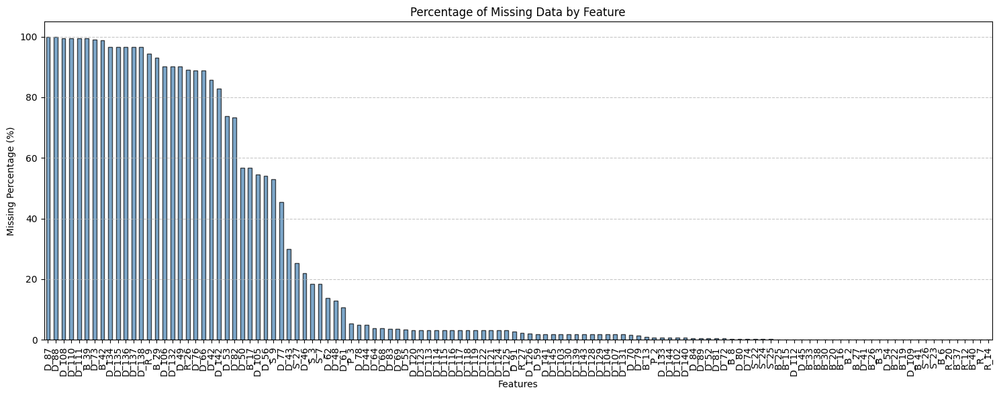

In [17]:
missing_data = pd.DataFrame({
    'Missing Count': missing_counts,
    'Missing Percentage': missing_percentage
}).sort_values(by='Missing Percentage', ascending=False)

missing_data_filtered = missing_data[missing_data['Missing Count'] > 0]

print("\nMissing Data Overview (Train Data):")
print(missing_data_filtered)

plt.figure(figsize=(15, 6))
missing_data_filtered['Missing Percentage'].plot(
    kind='bar', color='steelblue', alpha=0.7, edgecolor='black'
)
plt.title("Percentage of Missing Data by Feature")
plt.xlabel("Features")
plt.ylabel("Missing Percentage (%)")
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


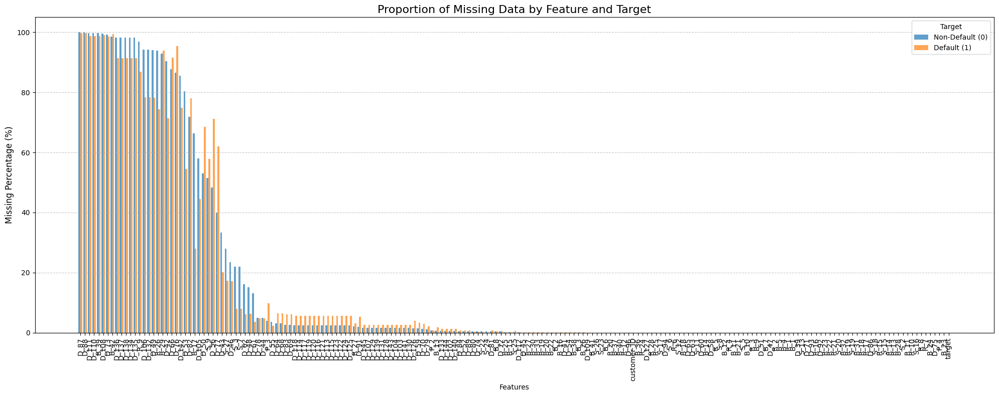

In [18]:
missing_data_by_target = {}

for target_value in [0, 1]:
    target_group = train[train['target'] == target_value]
    missing_counts = target_group.isna().sum()
    total_counts = len(target_group)
    missing_percentage = (missing_counts / total_counts) * 100

    missing_data_by_target[target_value] = pd.DataFrame({
        'Missing Count': missing_counts,
        'Missing Percentage': missing_percentage
    }).sort_values(by='Missing Percentage', ascending=False)

combined_missing_data = pd.concat(
    {
        "Non-Default (0)": missing_data_by_target[0]['Missing Percentage'],
        "Default (1)": missing_data_by_target[1]['Missing Percentage']
    },
    axis=1
)

combined_missing_data = combined_missing_data.dropna(how='all')

plt.figure(figsize=(20, 8))
width = 0.4
x = np.arange(len(combined_missing_data))

plt.bar(x - width/2, combined_missing_data["Non-Default (0)"], width=width, label="Non-Default (0)", alpha=0.7)
plt.bar(x + width/2, combined_missing_data["Default (1)"], width=width, label="Default (1)", alpha=0.7)

plt.title("Proportion of Missing Data by Feature and Target", fontsize=16)
plt.xlabel("Features", fontsize=10)
plt.ylabel("Missing Percentage (%)", fontsize=12)
plt.xticks(ticks=x, labels=combined_missing_data.index, rotation=90)
plt.legend(title="Target", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


Visualizing Missing Data Patterns:


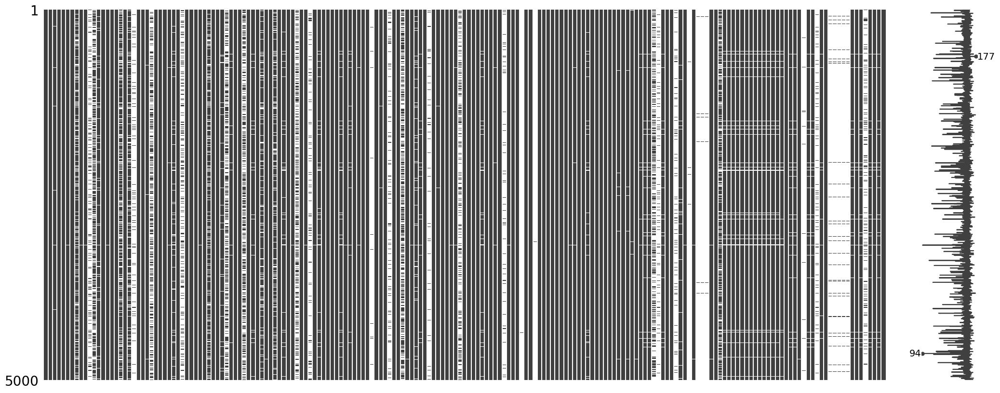

In [19]:
# 3. Is the missing data randomly distributed or does it exhibit a pattern?
print("\nVisualizing Missing Data Patterns:")
msno.matrix(train_data.sample(n=5000, random_state=42))
plt.show()

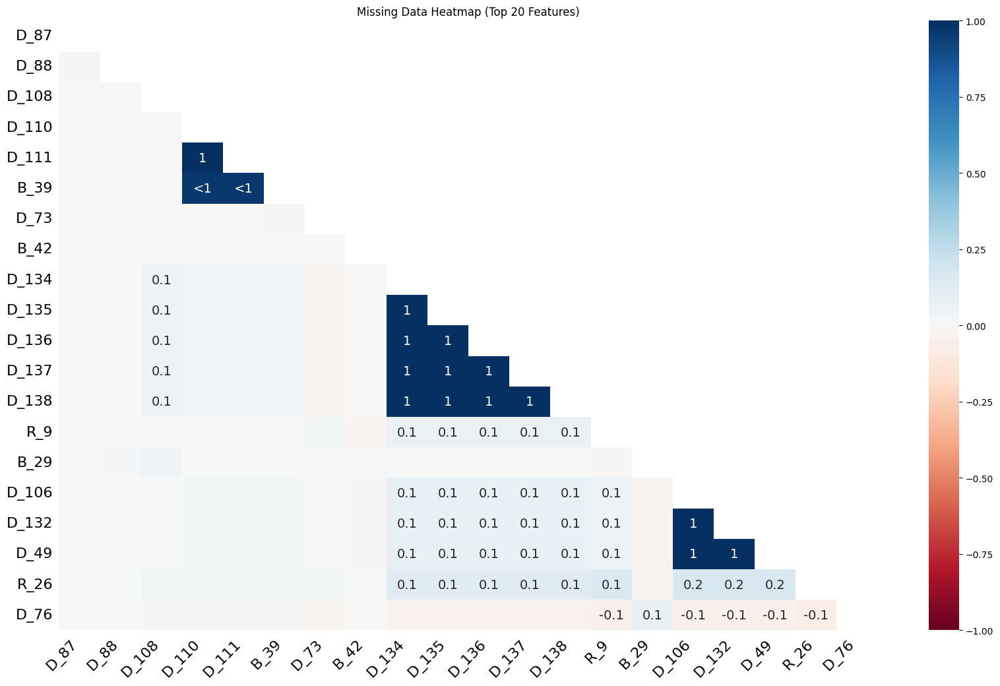

In [20]:
top_missing_features = train_data.isnull().sum().sort_values(ascending=False).head(20).index
msno.heatmap(train_data[top_missing_features])
plt.title("Missing Data Heatmap (Top 20 Features)")
plt.show()


The heatmap shows the correlation of missing values among the top 20 features with the highest missingness. Features like `D_111`, `D_134`, `D_135`, `D_136`, `D_137`, and `D_138` exhibit perfect correlation, indicating that their missingness is systemic and likely tied to similar underlying processes. In contrast, features like `B_39` and `D_108` display more independent missing patterns. These insights suggest that highly correlated missing features can be grouped for imputation or analysis, while independent features may require separate treatment. Additionally, systemic missingness could potentially be predictive if it relates to customer delinquency or other behaviors.

In [21]:
# 4. How does missing data correlate with the target variable or other features?
train_merged = train_data.sample(n=50000, random_state=42)

missing_indicators = train_merged.isnull().astype(int) 
missing_indicators['target'] = train_merged['target']

missing_corr = missing_indicators.corr()['target'].sort_values(ascending=False)
print("\nCorrelation of Missing Indicators with Target:")
print(missing_corr[1:]) 


Correlation of Missing Indicators with Target:
D_56     0.201234
D_77     0.188944
D_50     0.136184
D_76     0.117259
P_3      0.108931
           ...   
B_36          NaN
B_37          NaN
B_40          NaN
D_127         NaN
R_28          NaN
Name: target, Length: 190, dtype: float64


- **Target Variable Analysis:**

    - What is the distribution of the target variable?
    - Is there a class imbalance in the target variable?
    - How might the class imbalance affect modeling strategies?
    - How is the target variable calculated, and are there any nuances to consider?


Distribution of Target Variable:
target
0    340085
1    118828
Name: count, dtype: int64


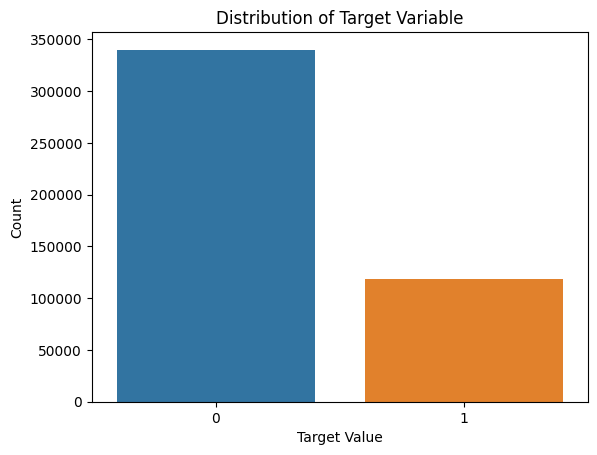

In [22]:
# 1. What is the distribution of the target variable?
print("\nDistribution of Target Variable:")
print(train_labels['target'].value_counts())

sns.countplot(x='target', data=train_labels)
plt.title("Distribution of Target Variable")
plt.xlabel("Target Value")
plt.ylabel("Count")
plt.show()


Proportion of Each Class in Target Variable:
target
0    74.106639
1    25.893361
Name: proportion, dtype: float64


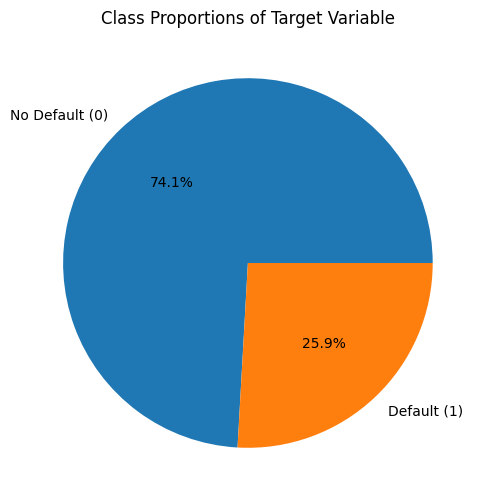

In [23]:
# 2. Is there a class imbalance in the target variable?
class_proportions = train_labels['target'].value_counts(normalize=True) * 100
print("\nProportion of Each Class in Target Variable:")
print(class_proportions)
class_proportions.plot(kind='pie', autopct='%1.1f%%', labels=['No Default (0)', 'Default (1)'],
                       figsize=(6, 6), title="Class Proportions of Target Variable")
plt.ylabel("") 
plt.show()

The pie chart shows the class distribution of the target variable, with 74.1% of customers classified as "No Default" (`target = 0`) and 25.9% classified as "Default" (`target = 1`). This indicates a significant class imbalance, with the majority of customers not defaulting on their payments. Such an imbalance suggests that special care will be needed during modeling, including techniques like re-sampling, class weighting, or using performance metrics that account for imbalance, such as precision, recall, or F1-score, to ensure fair evaluation and robust predictions for the minority class (defaults).

- **Univariate Analysis of Numerical Features**:

  - What are the basic statistics (mean, median, mode, variance, standard deviation) of each numerical feature?
  - What is the distribution of each numerical feature (e.g., normal, skewed)?
  - Are there outliers or extreme values in the numerical features?
  - Do any numerical features require transformation (e.g., log, square root) to reduce skewness?

In [10]:
del test

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

numerical_features = train_data.select_dtypes(include=['float32', 'int32']).columns.tolist()
print(f"Numerical Features: {len(numerical_features)} columns")

# 1. Basic Statistics for Numerical Features
basic_stats = train_data[numerical_features].describe().T
basic_stats['variance'] = train_data[numerical_features].var()  # Add variance
print("\nBasic Statistics for Numerical Features:")
print(basic_stats)

Numerical Features: 187 columns

Basic Statistics for Numerical Features:
            count      mean       std           min       25%       50%  \
P_2     5485466.0  0.656334  0.244649 -4.589548e-01  0.480331  0.694295   
D_39    5531451.0  0.153117  0.270071  5.026190e-09  0.004528  0.009057   
B_1     5531451.0  0.124010  0.211987 -7.588799e+00  0.008864  0.031330   
B_2     5529435.0  0.621489  0.401488  9.192280e-09  0.105331  0.814333   
R_1     5531451.0  0.078803  0.226397  1.534223e-09  0.002896  0.005782   
...           ...       ...       ...           ...       ...       ...   
D_142    944408.0  0.390799  0.236182 -1.453934e-02  0.199399  0.382136   
D_143   5429903.0  0.178802  0.378950  5.549692e-09  0.003028  0.006053   
D_144   5490724.0  0.052390  0.182514  2.500991e-09  0.002753  0.005508   
D_145   5429903.0  0.062335  0.193494  1.226024e-09  0.003028  0.006053   
target  5531451.0  0.249097  0.432490  0.000000e+00  0.000000  0.000000   

             75%       ma

In [6]:
basic_stats.to_csv("/kaggle/working/numerical_features_stats.csv", index=True)

### Bivariate Analysis Categorical Features

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

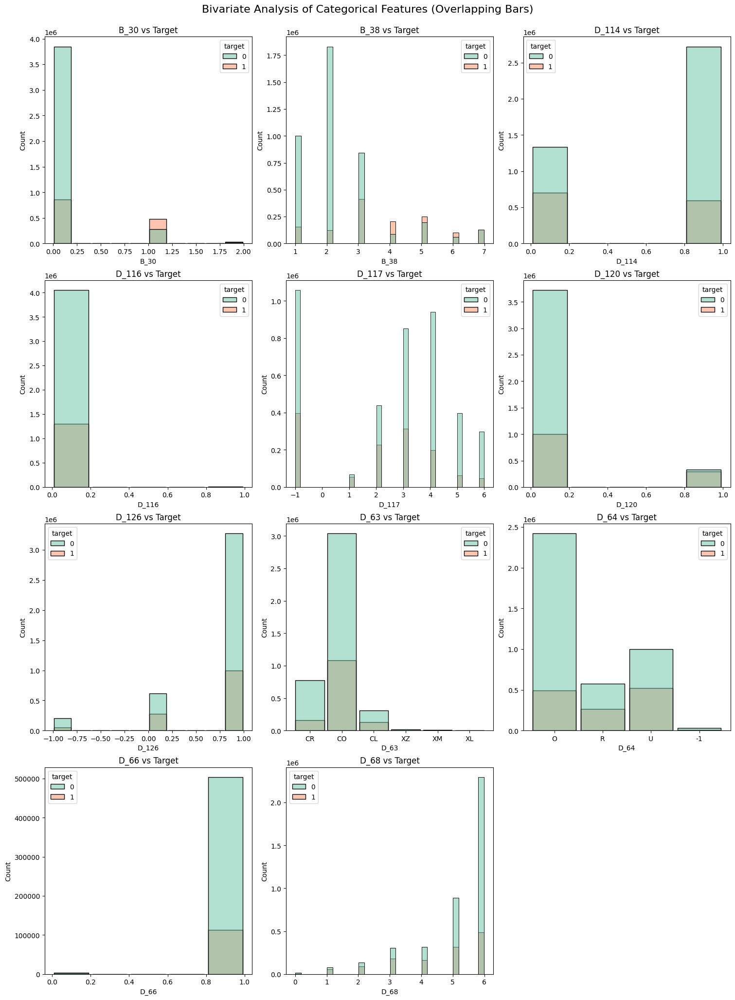

In [9]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns


warnings.filterwarnings("ignore", message="When grouping with a length-1 list-like")

if train.index.duplicated().sum() > 0:
    train.reset_index(drop=True, inplace=True)

categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 
                        'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

n_cols = 3
n_rows = (len(categorical_features) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(categorical_features):
    sns.histplot(
        data=train,
        x=feature,
        hue='target',
        multiple='layer',
        shrink=0.9,
        binwidth=0.2,
        palette='Set2',
        ax=axes[idx]
    )
    axes[idx].set_title(f"{feature} vs Target")
    axes[idx].set_xlabel(feature)
    axes[idx].set_ylabel("Count")

for i in range(len(categorical_features), len(axes)):
    axes[i].axis("off")

plt.suptitle("Bivariate Analysis of Categorical Features (Overlapping Bars)", fontsize=16, y=1.02)
plt.show()


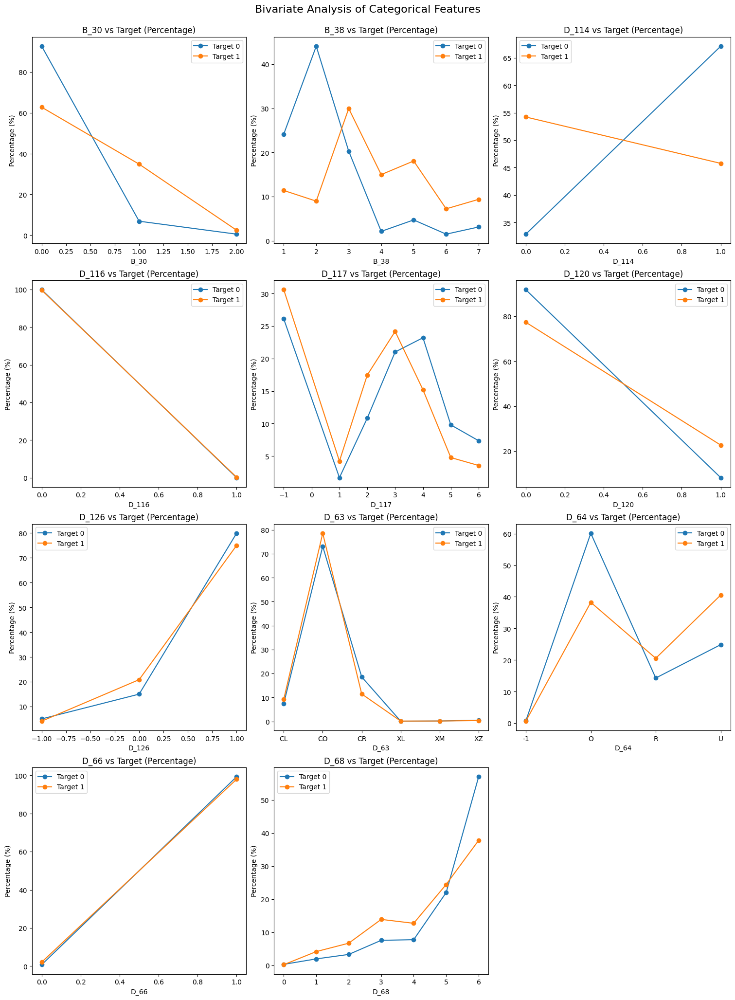

In [18]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore", message="When grouping with a length-1 list-like")

if train.index.duplicated().sum() > 0:
    train.reset_index(drop=True, inplace=True)

categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 
                        'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

n_cols = 3
n_rows = (len(categorical_features) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(categorical_features):
    data = train.groupby([feature, 'target']).size().reset_index(name='count')
    data['percentage'] = data['count'] / data.groupby('target')['count'].transform('sum') * 100


    for target_value in data['target'].unique():
        subset = data[data['target'] == target_value]
        axes[idx].plot(subset[feature], subset['percentage'], marker='o', label=f"Target {target_value}")
    
    axes[idx].set_title(f"{feature} vs Target (Percentage)")
    axes[idx].set_xlabel(feature)
    axes[idx].set_ylabel("Percentage (%)")
    axes[idx].legend()

for i in range(len(categorical_features), len(axes)):
    axes[i].axis("off")

plt.suptitle("Bivariate Analysis of Categorical Features", fontsize=16, y=1.02)
plt.show()


### Bivariate Analysis Binary Features

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


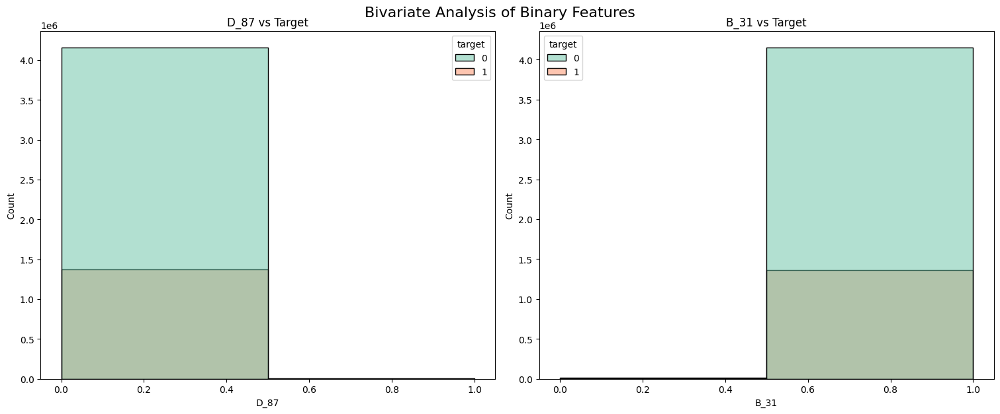

In [12]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", message="When grouping with a length-1 list-like")

binary_features = ['D_87', 'B_31']
for feature in binary_features:
    train[feature] = train[feature].fillna(0).astype(int)  # Ensure binary (0/1)

fig, axes = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)

for idx, feature in enumerate(binary_features):
    sns.histplot(
        data=train,
        x=feature,
        hue='target',
        multiple='layer',
        bins=2,  # Explicitly set bins for binary features
        palette='Set2',
        ax=axes[idx]
    )
    axes[idx].set_title(f"{feature} vs Target")
    axes[idx].set_xlabel(feature)
    axes[idx].set_ylabel("Count")

plt.suptitle("Bivariate Analysis of Binary Features", fontsize=16, y=1.02)
plt.show()


### Bivariate Analysis Numerical Features

In [11]:
gc.collect()


529

Numerical Features: ['D_102', 'R_26', 'B_42', 'S_22', 'D_42', 'S_9', 'D_94', 'B_28', 'B_1', 'B_5', 'D_62', 'B_20', 'D_80', 'R_18', 'D_129', 'B_15', 'bin', 'D_77', 'B_14', 'D_43', 'R_8', 'D_137', 'R_4', 'D_140', 'R_19', 'R_28', 'B_32', 'D_105', 'B_41', 'S_20', 'R_15', 'D_41', 'D_106', 'B_29', 'D_84', 'B_37', 'D_59', 'B_39', 'R_23', 'R_22', 'D_75', 'D_113', 'D_78', 'D_108', 'B_13', 'D_124', 'S_24', 'D_132', 'B_2', 'S_11', 'R_1', 'D_136', 'B_17', 'B_19', 'B_40', 'D_52', 'B_12', 'R_24', 'B_3', 'B_22', 'R_25', 'R_12', 'D_127', 'D_142', 'R_11', 'B_24', 'R_20', 'D_65', 'D_86', 'B_6', 'B_33', 'S_3', 'D_61', 'S_5', 'D_55', 'D_119', 'D_134', 'D_44', 'D_45', 'R_5', 'R_7', 'D_130', 'D_135', 'B_11', 'B_21', 'D_79', 'D_83', 'D_145', 'B_8', 'D_39', 'S_13', 'D_104', 'B_10', 'D_143', 'R_3', 'D_72', 'D_81', 'R_16', 'S_27', 'S_6', 'D_56', 'P_4', 'R_27', 'S_7', 'D_48', 'D_128', 'B_9', 'R_17', 'D_88', 'S_19', 'D_115', 'S_12', 'D_93', 'D_46', 'B_7', 'B_23', 'B_18', 'D_74', 'D_133', 'D_103', 'D_121', 'D_110'

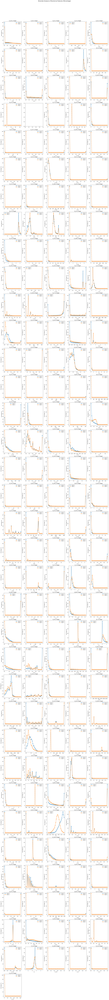

In [9]:
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

all_features = set(train.columns)

if train.index.duplicated().sum() > 0:
    train.reset_index(drop=True, inplace=True)
    print("Index reset. Duplicate indices removed.")

date_data = ['S_2']
binary_features = ['D_87', 'B_31']
categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
non_numerical_features = set(date_data + binary_features + categorical_features + ['target', 'customer_ID'])

numerical_features = list(all_features - non_numerical_features)

print(f"Numerical Features: {numerical_features}")

n_cols = 5
n_rows = (len(numerical_features) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(numerical_features):
    if pd.api.types.is_numeric_dtype(train[feature]):  
        data = train[[feature, 'target']].copy()
        data = data.dropna(subset=[feature])  
        data['bin'] = pd.cut(data[feature], bins=30)   
        
        percentages = (
            data.groupby(['bin', 'target'])
            .size()
            .div(data.groupby('target')[feature].count())   
            .reset_index(name='percentage')
        )

        for target_value in percentages['target'].unique():
            subset = percentages[percentages['target'] == target_value]
            subset['bin_center'] = subset['bin'].apply(lambda b: b.mid)
            axes[idx].plot(subset['bin_center'], subset['percentage'] * 100, marker='o', label=f"Target {target_value}")
        
        axes[idx].set_title(f"{feature} vs Target")
        axes[idx].set_xlabel(feature)
        axes[idx].set_ylabel("Percentage (%)")
        axes[idx].legend()
    else:
        print(f"Skipping non-numeric feature: {feature}")

for i in range(len(numerical_features), len(axes)):
    axes[i].axis("off")

plt.suptitle("Bivariate Analysis of Numerical Features (Percentage)", fontsize=16, y=1.02)
plt.show()


Numerical Features: ['R_26', 'B_37', 'D_69', 'D_111', 'B_26', 'D_60', 'D_84', 'D_104', 'D_50', 'S_26', 'R_14', 'D_43', 'D_105', 'D_88', 'R_22', 'D_130', 'B_23', 'B_18', 'D_138', 'D_134', 'R_13', 'D_89', 'B_36', 'B_6', 'D_49', 'B_24', 'B_40', 'D_144', 'S_20', 'D_102', 'B_2', 'R_4', 'D_107', 'D_135', 'D_80', 'D_108', 'P_3', 'D_56', 'D_143', 'R_1', 'S_25', 'D_112', 'B_8', 'B_20', 'D_137', 'B_14', 'D_70', 'R_6', 'R_3', 'D_86', 'D_113', 'D_131', 'B_33', 'S_11', 'D_39', 'D_79', 'D_91', 'D_129', 'S_15', 'B_19', 'R_28', 'S_17', 'R_21', 'D_71', 'D_106', 'B_22', 'B_41', 'R_15', 'D_103', 'D_78', 'D_109', 'D_45', 'D_133', 'P_2', 'S_9', 'D_128', 'R_24', 'S_18', 'B_10', 'D_118', 'B_13', 'B_1', 'R_9', 'D_47', 'R_19', 'R_7', 'S_5', 'D_58', 'D_74', 'D_110', 'D_51', 'B_28', 'R_27', 'D_83', 'D_55', 'D_65', 'R_23', 'S_7', 'D_53', 'D_59', 'B_15', 'B_32', 'D_127', 'P_4', 'B_17', 'D_81', 'D_139', 'R_20', 'D_119', 'D_142', 'R_18', 'R_10', 'D_140', 'D_76', 'S_16', 'S_22', 'B_11', 'S_23', 'B_29', 'D_73', 'S_27'

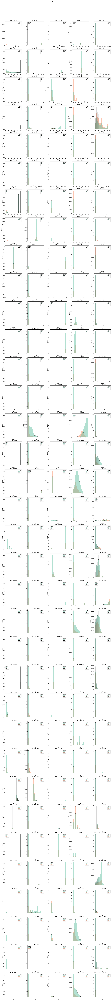

In [13]:
warnings.filterwarnings("ignore", message="use_inf_as_na option is deprecated and will be removed in a future version")

all_features = set(train.columns)

if train.index.duplicated().sum() > 0:
    train.reset_index(drop=True, inplace=True)
    print("Index reset. Duplicate indices removed.")

date_data = ['S_2']
binary_features = ['D_87', 'B_31']
categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
non_numerical_features = set(date_data + binary_features + categorical_features + ['target', 'customer_ID'])

numerical_features = list(all_features - non_numerical_features)

print(f"Numerical Features: {numerical_features}")

n_cols = 5
n_rows = (len(numerical_features) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(numerical_features):
    sns.histplot(
        data=train,
        x=feature,
        hue='target',
        multiple='layer',
        bins=30,
        palette='Set2',
        ax=axes[idx]
    )
    axes[idx].set_title(f"{feature} vs Target")
    axes[idx].set_xlabel(feature)
    axes[idx].set_ylabel("Count")

for i in range(len(numerical_features), len(axes)):
    axes[i].axis("off")

plt.suptitle("Bivariate Analysis of Numerical Features", fontsize=16, y=1.02)
plt.show()


- **Statements Per Customer**


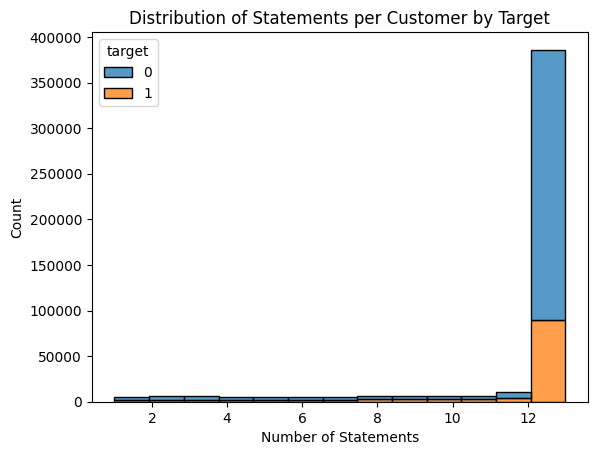

In [14]:
statements_per_customer = train.groupby('customer_ID')['S_2'].count().rename('Num_Statements').reset_index()

statements_per_customer = statements_per_customer.merge(train[['customer_ID', 'target']].drop_duplicates(), on='customer_ID')

sns.histplot(
    data=statements_per_customer, 
    x='Num_Statements', 
    hue='target', 
    multiple='stack', 
    bins=13, 
    kde=False
)
plt.title("Distribution of Statements per Customer by Target")
plt.xlabel("Number of Statements")
plt.ylabel("Count")
plt.show()


- **Timing of Last Statement**

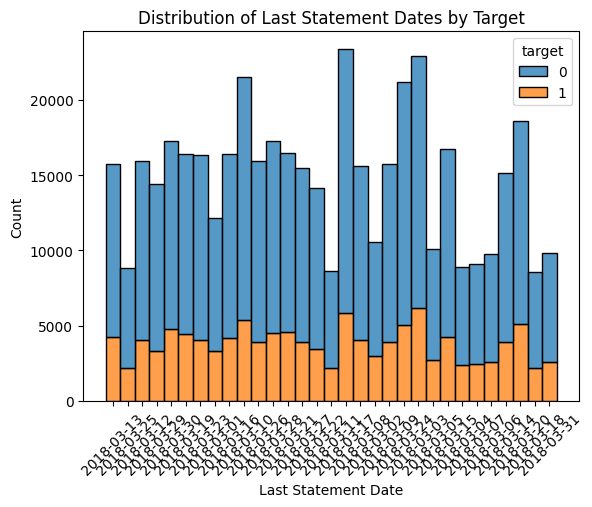

In [15]:
last_statement_date = train.groupby('customer_ID')['S_2'].max().reset_index()
last_statement_date = last_statement_date.merge(train[['customer_ID', 'target']].drop_duplicates(), on='customer_ID')

sns.histplot(
    data=last_statement_date, 
    x='S_2', 
    hue='target', 
    multiple='stack', 
    bins=20, 
    kde=False
)
plt.title("Distribution of Last Statement Dates by Target")
plt.xlabel("Last Statement Date")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()


- **Statements Timeline Analysis**

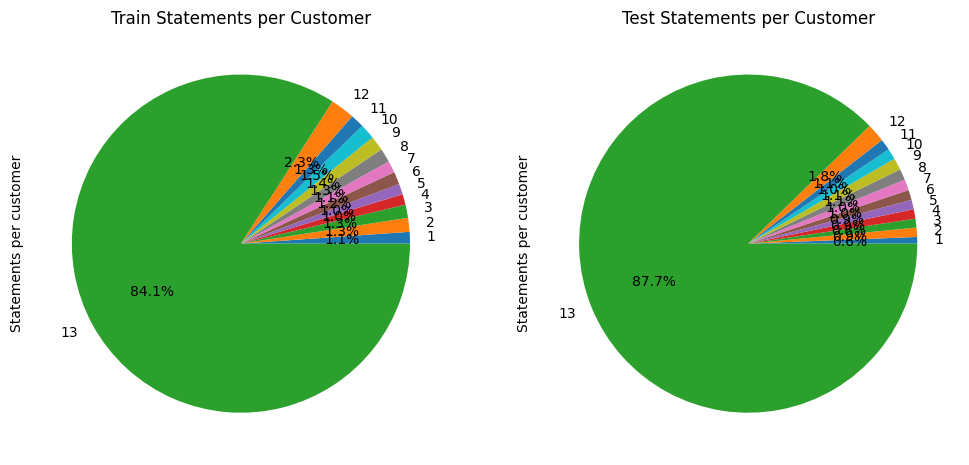

In [4]:
import matplotlib.pyplot as plt
train_statements = train.groupby('customer_ID').size().value_counts().sort_index().rename('Statements per customer')
test_statements = test.groupby('customer_ID').size().value_counts().sort_index().rename('Statements per customer')

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
train_statements.plot.pie(ax=axes[0], autopct='%1.1f%%', labels=train_statements.index, title='Train Statements per Customer')
test_statements.plot.pie(ax=axes[1], autopct='%1.1f%%', labels=test_statements.index, title='Test Statements per Customer')
plt.show()


**Last Statement Dates**

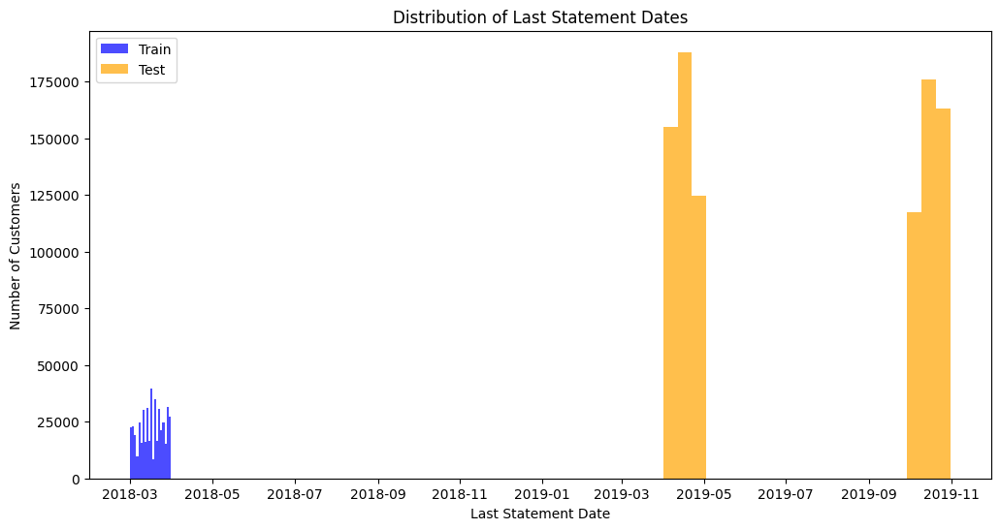

In [5]:
train['S_2'] = pd.to_datetime(train['S_2'])
test['S_2'] = pd.to_datetime(test['S_2'])

train_last_dates = train.groupby('customer_ID')['S_2'].max()
test_last_dates = test.groupby('customer_ID')['S_2'].max()

plt.figure(figsize=(12, 6))
plt.hist(train_last_dates, bins=20, alpha=0.7, label='Train', color='blue')
plt.hist(test_last_dates, bins=20, alpha=0.7, label='Test', color='orange')
plt.title("Distribution of Last Statement Dates")
plt.xlabel("Last Statement Date")
plt.ylabel("Number of Customers")
plt.legend()
plt.show()


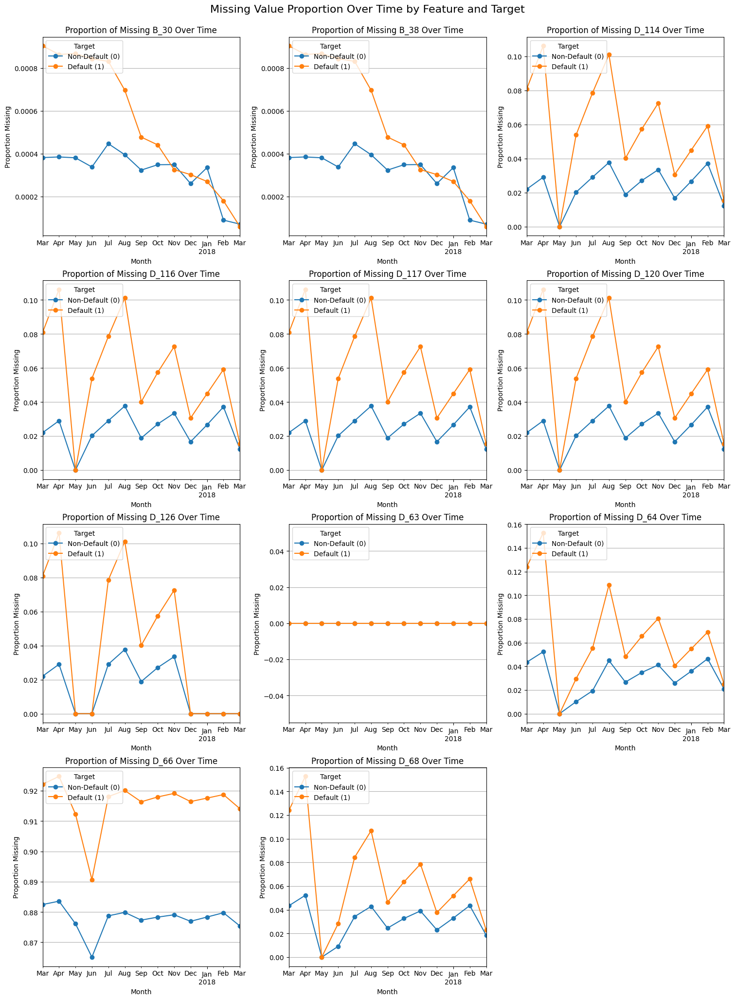

In [7]:

categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

features_to_analyze = categorical_features

n_cols = 3
n_rows = int(np.ceil(len(features_to_analyze) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(features_to_analyze):
    missing_over_time = train[['S_2', feature, 'target']].copy()
    missing_over_time['missing'] = missing_over_time[feature].isna()
    missing_by_target = (
        missing_over_time
        .groupby([missing_over_time['S_2'].dt.to_period('M'), 'target'])['missing']
        .mean()
        .unstack()
    )

    ax = axes[idx]
    missing_by_target.plot(kind='line', marker='o', ax=ax)
    ax.set_title(f"Proportion of Missing {feature} Over Time")
    ax.set_xlabel("Month")
    ax.set_ylabel("Proportion Missing")
    ax.grid(axis='y')
    ax.legend(title="Target", labels=["Non-Default (0)", "Default (1)"], loc='upper left')

for i in range(len(features_to_analyze), len(axes)):
    axes[i].axis('off')

plt.suptitle("Missing Value Proportion Over Time by Feature and Target", fontsize=16, y=1.02)
plt.show()


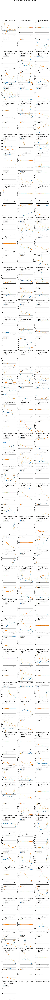

In [9]:
all_features = set(train.columns)

date_data = ['S_2']
binary_features = ['D_87', 'B_31']
categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
non_numerical_features = set(date_data + binary_features + categorical_features + ['target', 'customer_ID'])

numerical_features = list(all_features - non_numerical_features)
features_to_analyze = numerical_features

n_cols = 3
n_rows = int(np.ceil(len(features_to_analyze) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5), constrained_layout=True)
axes = axes.flatten()

for idx, feature in enumerate(features_to_analyze):
    missing_over_time = train[['S_2', feature, 'target']].copy()
    missing_over_time['missing'] = missing_over_time[feature].isna()
    missing_by_target = (
        missing_over_time
        .groupby([missing_over_time['S_2'].dt.to_period('M'), 'target'])['missing']
        .mean()
        .unstack()
    )

    ax = axes[idx]
    missing_by_target.plot(kind='line', marker='o', ax=ax)
    ax.set_title(f"Proportion of Missing {feature} Over Time")
    ax.set_xlabel("Month")
    ax.set_ylabel("Proportion Missing")
    ax.grid(axis='y')
    ax.legend(title="Target", labels=["Non-Default (0)", "Default (1)"], loc='upper left')

for i in range(len(features_to_analyze), len(axes)):
    axes[i].axis('off')

plt.suptitle("Missing Value Proportion Over Time by Feature and Target", fontsize=16, y=1.02)
plt.show()


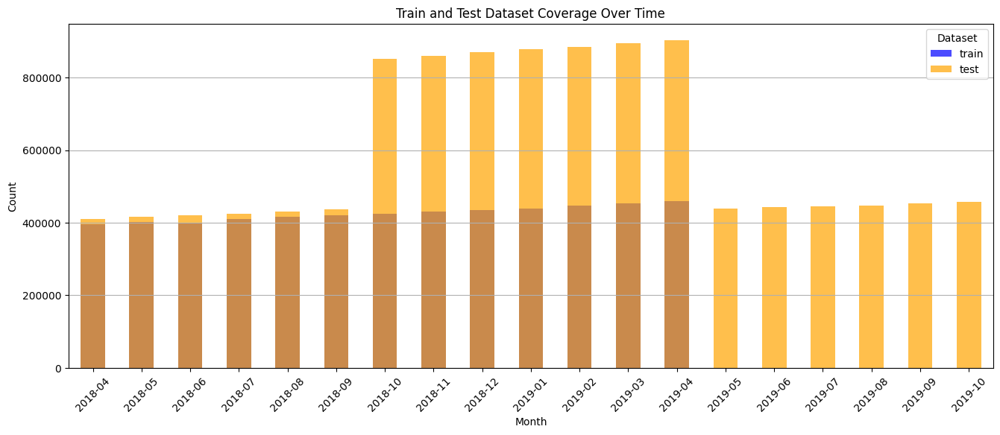

In [10]:
temp = pd.concat([train[['customer_ID', 'S_2']], test[['customer_ID', 'S_2']]], axis=0)
temp['S_2'] = pd.to_datetime(temp['S_2'])
temp['dataset'] = ['train'] * len(train) + ['test'] * len(test)

plt.figure(figsize=(16, 6))
colors = {'train': 'blue', 'test': 'orange'}  

for dataset in temp['dataset'].unique():
    dataset_subset = temp[temp['dataset'] == dataset]
    dataset_subset['S_2'].dt.to_period('M').value_counts().sort_index().plot(
        kind='bar', 
        alpha=0.7, 
        color=colors[dataset], 
        label=dataset
    )

plt.title("Train and Test Dataset Coverage Over Time")
plt.xlabel("Month")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.legend(title="Dataset")
plt.grid(axis='y')
plt.show()


## 2. Hypothesize Causes of Missingness
### Delinquency Variables (D_*)
* Missing values might indicate customers with no delinquencies during the reporting period.
* Hypothesis: Missingness is informative and suggests low credit risk.
### Spend Variables (S_*)
* Missing values may occur when customers had no spending activity during the period.
* Hypothesis: Missingness may correlate with inactivity or conservative spending behavior.
### Payment Variables (P_*)
* Missing values could arise if customers did not make any payments during a particular period.
* Hypothesis: Missingness might signal financial distress or irregular payment behavior.
### Balance Variables (B_*)
* Missing values might indicate no balance carried forward for a statement period.
* Hypothesis: Missingness may correlate with customers who pay off balances fully each month.
### Risk Variables (R_*)
* Missing values could represent non-assessment of risk factors during the statement period.
* Hypothesis: Missingness might correlate with stable credit behavior or low risk.

Columns with Missing Values:
       Missing Values  Percentage
D_87          5527586   99.930127
D_88          5525447   99.891457
D_108         5502513   99.476846
D_110         5500117   99.433530
D_111         5500117   99.433530
...               ...         ...
B_37               56    0.001012
R_12               56    0.001012
B_40               53    0.000958
R_7                 1    0.000018
R_14                1    0.000018

[122 rows x 2 columns]


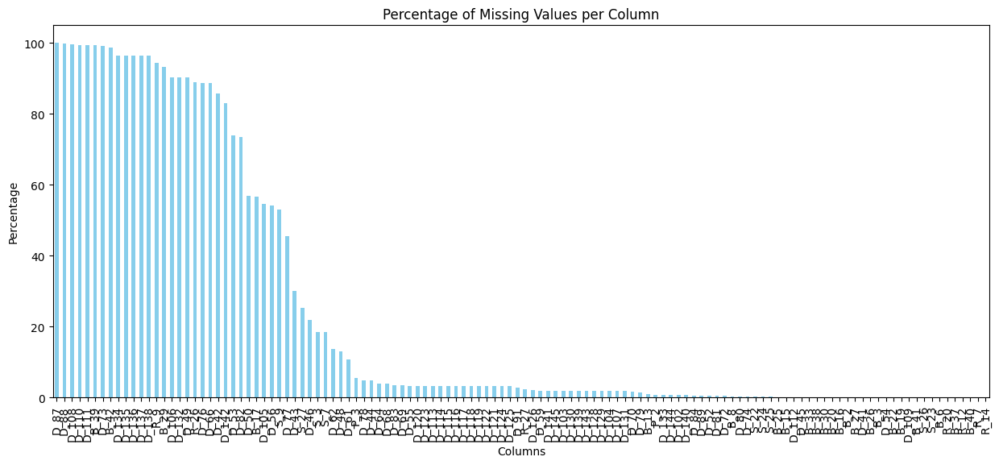

In [10]:

import matplotlib.pyplot as plt

missing_values = train.isnull().sum()
missing_percentage = (missing_values / len(train)) * 100

missing_summary = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
}).sort_values(by='Percentage', ascending=False)

print("Columns with Missing Values:")
print(missing_summary[missing_summary['Missing Values'] > 0])


plt.figure(figsize=(15, 6))
missing_summary[missing_summary['Missing Values'] > 0]['Percentage'].plot(kind='bar', color='skyblue')
plt.title("Percentage of Missing Values per Column")
plt.ylabel("Percentage")
plt.xlabel("Columns")
plt.xticks(rotation=90)
plt.show()


In [11]:
print("Columns with Missing Values:")
missing_summary[missing_summary['Missing Values'] > 0].to_csv('/kaggle/working/missing_value.csv')

Columns with Missing Values:


  Category  Avg Missing Percentage
0       D_               27.778329
4       R_               26.523395
3       B_               15.212823
1       S_               12.910434
2       P_                3.140921


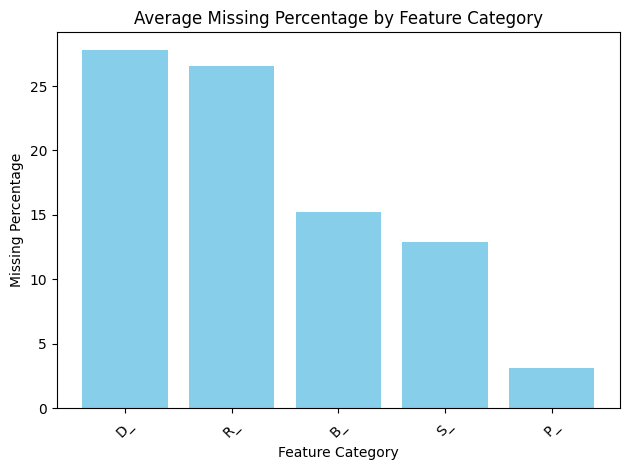

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

missing_value_data = pd.read_csv('/kaggle/working/missing_value.csv')

categories = ['D_', 'S_', 'P_', 'B_', 'R_']

category_missing = {}
for category in categories:
    category_features = [col for col in missing_value_data['Unnamed: 0'] if col.startswith(category)]
    avg_missing = missing_value_data[missing_value_data['Unnamed: 0'].isin(category_features)]['Percentage'].mean()
    category_missing[category] = avg_missing

category_missing_df = pd.DataFrame(category_missing.items(), columns=['Category', 'Avg Missing Percentage'])
category_missing_df.sort_values(by='Avg Missing Percentage', ascending=False, inplace=True)

print(category_missing_df)

plt.bar(category_missing_df['Category'], category_missing_df['Avg Missing Percentage'], color='skyblue')
plt.title("Average Missing Percentage by Feature Category")
plt.ylabel("Missing Percentage")
plt.xlabel("Feature Category")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 3. Analyze Missingness vs. Target
#### Test if Missingness is Informative
Check whether the proportion of missing values in each category correlates with default behavior:

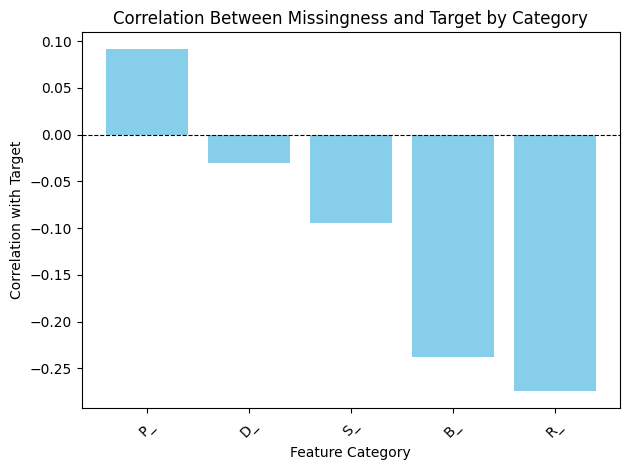

In [17]:
correlations = []

for category in categories:
    category_features = [col for col in train.columns if col.startswith(category)]
    train[f'{category}_missingness'] = train[category_features].isna().mean(axis=1)
    corr = train[['target', f'{category}_missingness']].corr().iloc[0, 1]
    correlations.append((category, corr))

correlation_df = pd.DataFrame(correlations, columns=['Category', 'Correlation with Target'])
correlation_df.sort_values(by='Correlation with Target', ascending=False, inplace=True)

plt.bar(correlation_df['Category'], correlation_df['Correlation with Target'], color='skyblue')
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
plt.title("Correlation Between Missingness and Target by Category")
plt.ylabel("Correlation with Target")
plt.xlabel("Feature Category")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


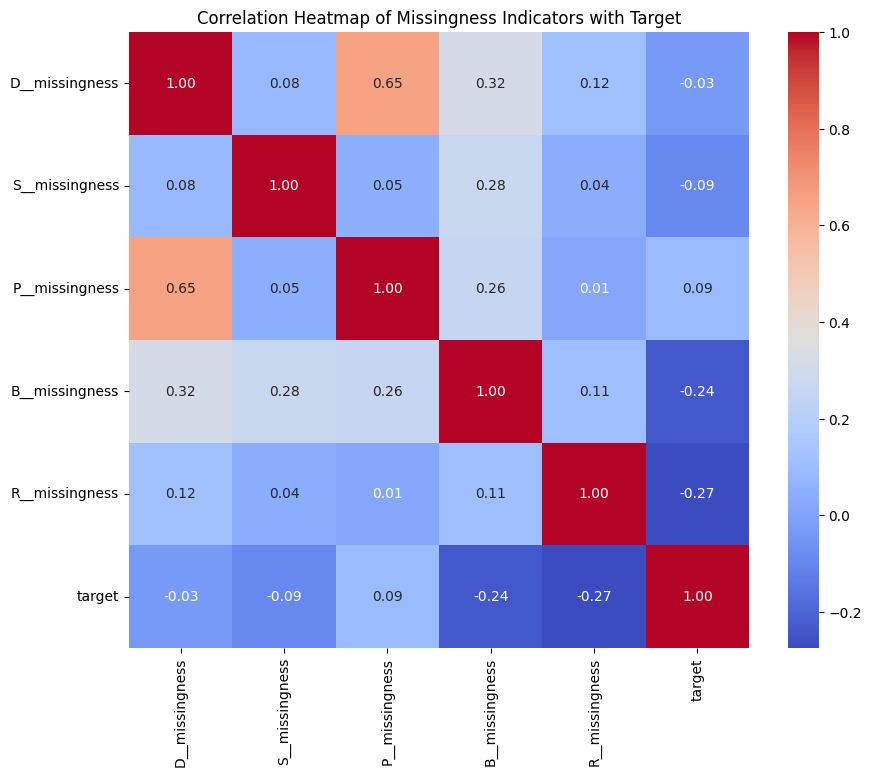

In [18]:
missingness_indicators = [col for col in train.columns if 'missingness' in col]

missing_corr = train[missingness_indicators + ['target']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(missing_corr, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title("Correlation Heatmap of Missingness Indicators with Target")
plt.show()
